In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import cv2

# Image Manipulation 

1- Read and display the image "mandrill.png" using the functions cv.imread and plt.imshow
Note: In the case of color images, the cv.imread function stores the RGB channels in the reverse order
BGR, so you need to swap them using the cv.cvtColor statement with cv.COLOR_BGR2RGB.

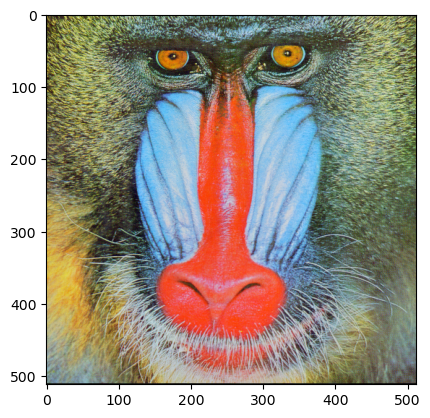

In [4]:
image = cv2.imread("./images/images/mandrill.png")
img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(img)

2- Display the size and depth of the image using the functions img.shape and img.dtype.
Why are the image values of type "uint8"?

In [4]:
print(img.shape)
print(img.dtype)

(512, 512, 3)
uint8


Why are the image values of type "uint8"? 
"uint8" stands for "unsigned 8-bit integer" This data type is commonly used to represent pixel values in digital images, each pixel's color or intensity is typically represented as a combination of red, green, and blue (RGB) values, each ranging from 0 to 255. Using an 8-bit unsigned integer for each channel allows for 256 different values for each channel

3- Separate the RGB channels and visualize each channel independently.Explain how the mandrill's eyes appear in the three RGB components

In [7]:
blue_channel = img[:, :, 2]
green_channel = img[:, :, 1]
red_channel = img[:, :, 0]

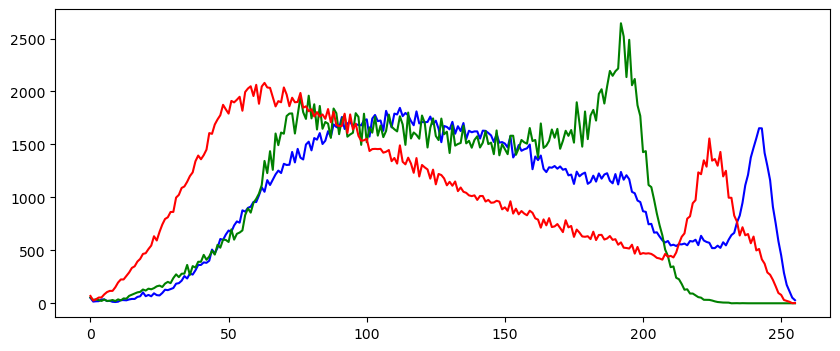

In [8]:
#See pixels intensities in the 3 channels 
plt.figure(figsize=(10, 4))
colors = ('blue','green','red')
label = ("Blue", "Green", "Red")
for count,color in enumerate(colors):
    histogram = cv2.calcHist([img],[count],None,[256],[0,256])
    plt.plot(histogram,color = color, label=label[count]+str(" Pixels"))

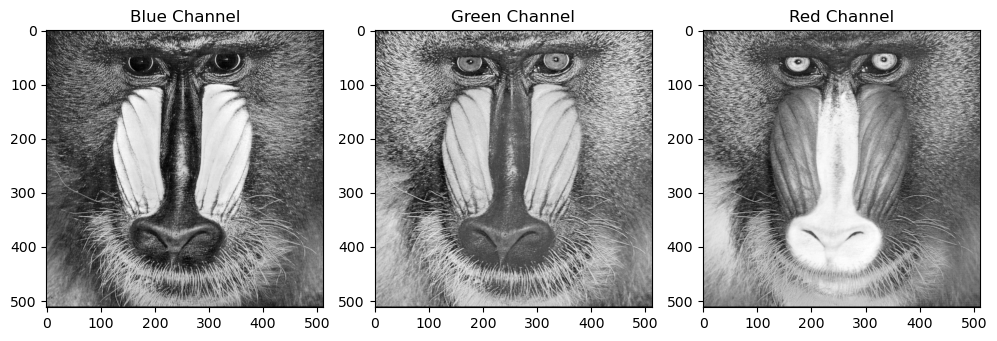

In [9]:
plt.figure(figsize=(10, 4))

plt.subplot(131)
plt.imshow(blue_channel, cmap='gray')
plt.title('Blue Channel')

plt.subplot(132)
plt.imshow(green_channel, cmap='gray')
plt.title('Green Channel')

plt.subplot(133)
plt.imshow(red_channel, cmap='gray')
plt.title('Red Channel')

plt.tight_layout()  # Ensures subplots don't overlap
plt.show()

The mandrill's eyes are yellow, which means they have a significant contribution from both the Red and Green channels while the Blue channel likely has a minimal contribution.

In the Red channel, the eyes appear as bright or white regions since yellow is a combination of full Red and Green channels without much Blue.
In the Green channel, the eyes appear bright region but not as bright as in the red channel, because his eyes are kinda orange more than pure yellow! 
In the Blue channel, the eyes appear dark because there's very little Blue in yellow, so the intensisty is very low! 

4- Store the R component of the image in a .png file, the G component in a .bmp file, 
and the B component in a .jpeg file using the cv.imwrite instruction.

In [10]:
cv2.imwrite('red_component.png', red_channel)
cv2.imwrite('green_component.bmp', green_channel)
cv2.imwrite('blue_component.jpeg', blue_channel)

True

5- Perform grayscale conversion using the following expression:
    luminance = 0.2126 × Red + 0.7152 × Green + 0.0722 × Blue.
and after this using the cv2color function.

In [11]:
luminance_gray = (0.2126 * red_channel + 0.7152 * green_channel + 0.0722 * blue_channel).astype(np.uint8)
gray_using_cv2 = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


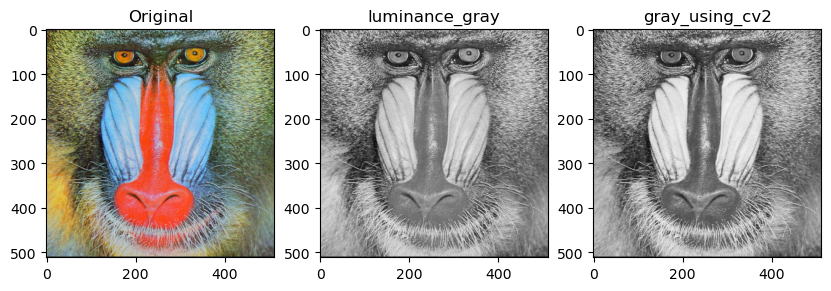

In [12]:
plt.figure(figsize=(10, 4))

plt.subplot(131)
plt.imshow(img)
plt.title('Original')

plt.subplot(132)
plt.imshow(luminance_gray, cmap='gray')
plt.title('luminance_gray')

plt.subplot(133)
plt.imshow(gray_using_cv2,cmap='gray')
plt.title('gray_using_cv2')


plt.show()

There is a slight difference that can be justified by the minor inaccuracies and uncertainties present in the Luminance formula.

6- Examine the histogram. Determine the extrema of the image. What can you say about the quality of this image?

Histogram

Text(0, 0.5, 'Density')

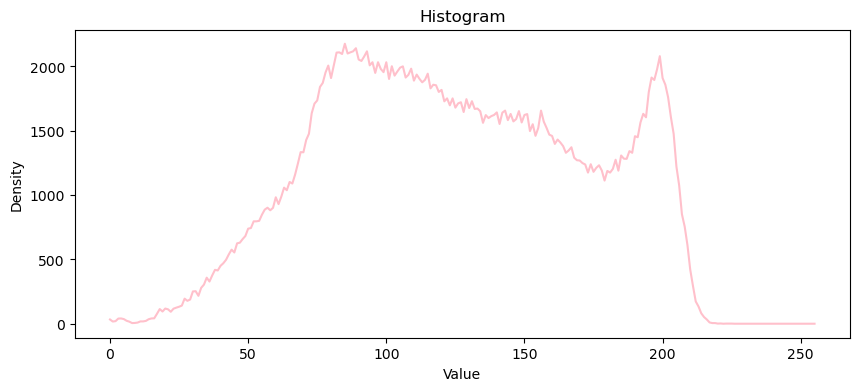

In [11]:
plt.figure(figsize=(10, 4))
#plt.hist(x=img.ravel(),bins=256,range=[0,256],color='pink')
hist = cv2.calcHist([gray_using_cv2], [0], None, [256], [0, 256]) #image,channels,mask, histSize, ranges[, hist[, accumulate=0 default
plt.plot(hist,color='pink')
plt.title('Histogram')
plt.xlabel("Value")
plt.ylabel("Density")

Image quality

In [12]:
# Determine the extrema (min and max values) of the image
min_intensity = np.min(gray_using_cv2)
max_intensity = np.max(gray_using_cv2)
print('min :', min_intensity)
print('max :' ,max_intensity)


min : 0
max : 225


The quality of an image cannot be determined solely based on the minimum and maximum values. The quality of an image depends on various factors such as resolution, sharpness, focus, noise levels, color accuracy, and more. However, knowing the pixel value range (0 to 225) could imply that the image might lack contrast or could be underexposed.

## Quantization

We want to determine the influence of variable quantization steps,

1- Change the quantization step of the image to obtain 128, 64, 32, 16, 8, 4, and 2 levels of gray.

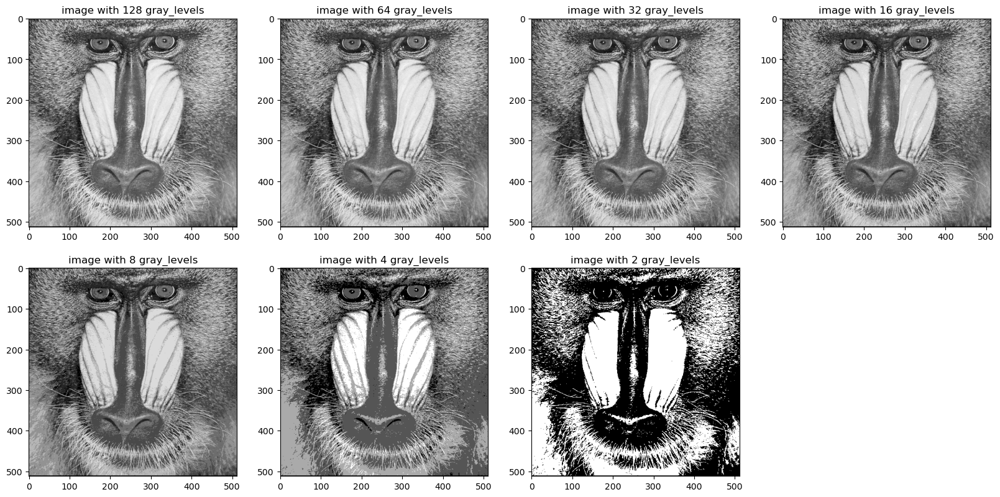

In [13]:
def quantification(img,level):
    e=np.asarray(img) #converts the input image to NPARRAY
    c=np.copy(e)
    pas=int(256/level) # dividing 256 by the specified number of gray levels 
    for ligne in range(c.shape[0]):
        for colonne in range(c.shape[1]):
            c[ligne,colonne]=(c[ligne,colonne]//pas)*pas
    return c

#quantification avec 128 niveaux de gris : 
plt.figure(figsize=(20, 20)) 
gray_levels=[256,128,64,32,16,8,4,2]
for i in range(1,8):
     level_i=quantification(gray_using_cv2,gray_levels[i])
     plt.subplot(4,4,i)
     plt.imshow(level_i,cmap='gray')
     plt.title("image with " +str(gray_levels[i])+" gray_levels")

2- Determine the minimum quantization level at which false contours appear (display the images for this).

We can see clearly that false contours start to appear after the 8-bit level, it has the minimal right edges , after that we start to notice the false contour ( nose ) 

Text(0.5, 1.0, 'image with 8 gray_levels')

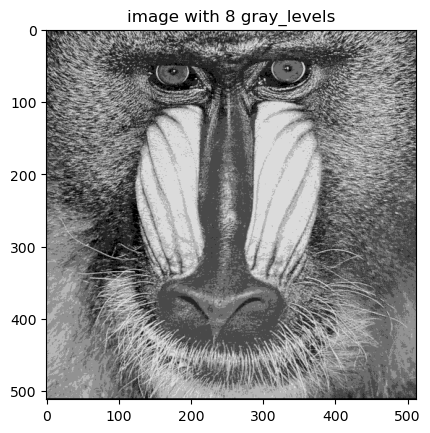

In [14]:
plt.imshow(quantification(gray_using_cv2,gray_levels[-3]),cmap='gray')
plt.title("image with " +str(gray_levels[-3])+" gray_levels")

3- Calculate and display the histogram of each quantization

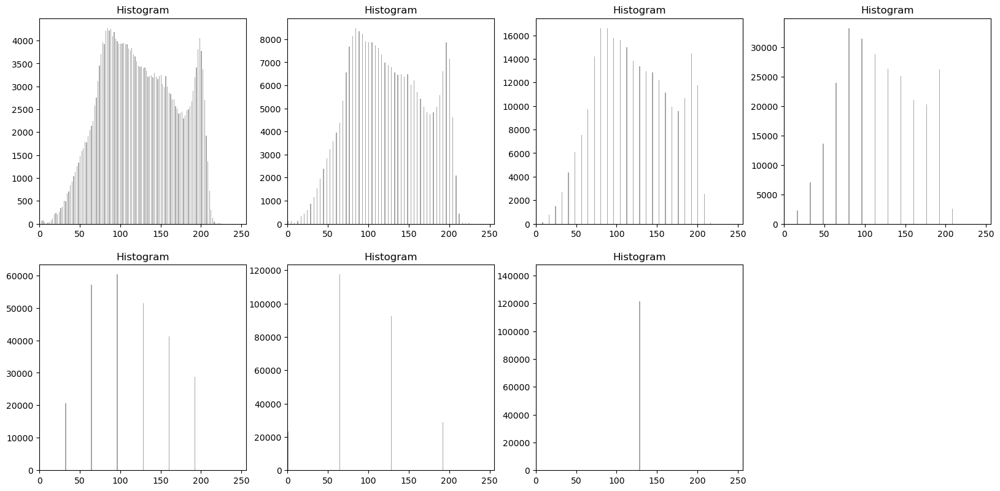

In [15]:
plt.figure(figsize=(20, 20)) 
gray_levels=[256,128,64,32,16,8,4,2]
for i in range(1,8):
    level_i=quantification(gray_using_cv2,gray_levels[i])
    plt.subplot(4, 4, i )
    plt.hist(level_i.ravel(), bins=256, range=(0, 256), color='gray', alpha=0.7)
    plt.title("Histogram")
    plt.xlim(0, 256)

When we change the quantization step of an image to obtain different levels of gray (e.g., 128, 64, 32, 16, 8, 4, and 2 levels), we are essentially reducing the number of possible shades of gray in the image. This process is known as image quantization or bit-depth reduction. By creating histograms for each quantized version, we can observe how the distribution of pixel values changes as we reduce the number of levels => Loss of Detail, Increased Contrast, appearing of False contours and reducing the file size. 
We notice also in the histogram Shape: The histograms for each quantized version will show a clustering of pixel values around the quantization levels. For example, when you quantize to 2 levels, you will have two major peaks in the histogram, and as you increase the number of levels, the histogram becomes more granular.


## Histogram Equalization

1- Read and display the 'flower.bmp' image and convert the image to grayscale.

(480, 512)

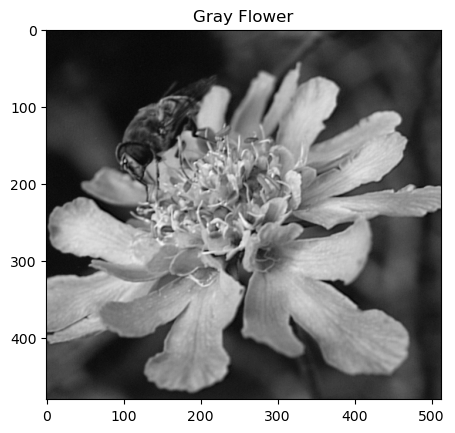

In [16]:
flower = cv2.imread("./images/images/flower.bmp")
flower_gray = cv2.cvtColor(flower, cv2.COLOR_BGR2GRAY)

plt.imshow(flower_gray,cmap='gray')
plt.title("Gray Flower")
flower_gray.shape

2- Calculate and display the histogram and the normalized histogram. Provide comments.

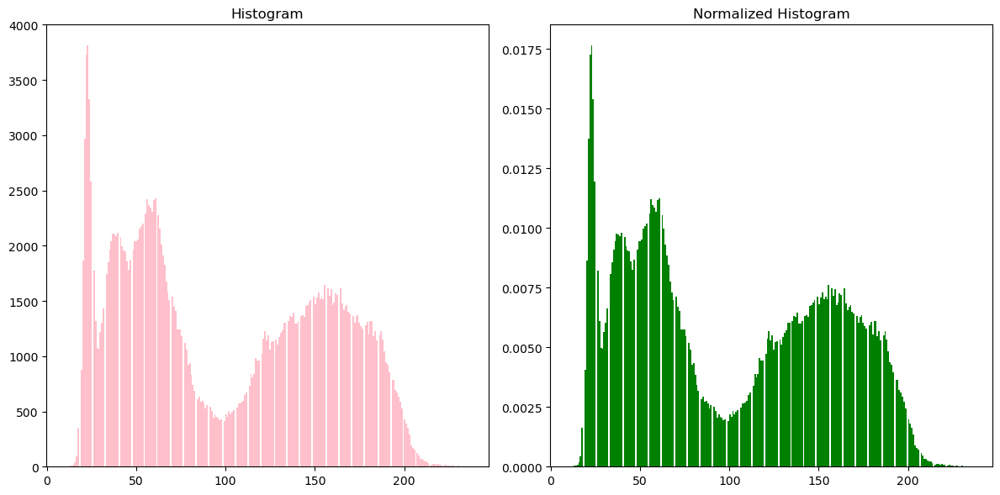

In [17]:
hist, bins = np.histogram(flower_gray, bins=256, range=(0, 256))
hist_normalized = hist / np.sum(hist)
plt.figure(figsize=(12, 6))

# Plot the histogram
plt.subplot(1, 2, 1)
plt.hist(flower_gray.ravel(), bins=256, color='pink')
plt.title("Histogram")

# Plot the normalized histogram
plt.subplot(1, 2, 2)
plt.hist(flower_gray.ravel(), bins = 256, density = True, color = 'green')
plt.title("Normalized Histogram")

plt.tight_layout()
plt.show()

Comments : 
- The histogram provides us with the count of occurrences of gray levels. 
- The normalized histogram gives us the probability of gray level occurrences (the frequency of appearance= the proportion of each intensity level in the image). 
- Absence of gray levels from 0 to 10 and the rarity of values from 200-250, so the histogram is not well distributed; it needs to be flattened.

3- Calculate and display the cumulative histogram. Provide comments.

Text(0.5, 1.0, 'Cumulative Histogram ')

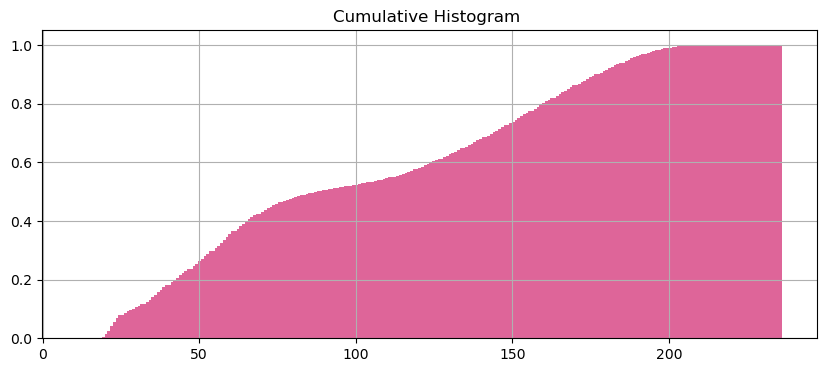

In [18]:
plt.figure(figsize=(10, 4))
plt.hist(flower_gray.flatten(), bins = 256, density = True, cumulative=True, color= '#DE6599') #ILOVE PINK 
plt.grid(True)
plt.title("Cumulative Histogram ")

The cumulative histogram provides us with the rate of occurrence of all gray levels lower than a certain value. We observe two gradients (slopes): intensities increase between 24-80, with a gradual rise between the two gradients, followed by an increase in intensities between 150 and 200.

4- Perform histogram equalization, display the equalized histogram, and provide comments.

we will use the formula from the lecture! 

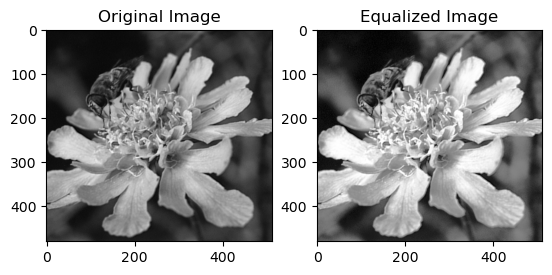

In [34]:
# Define the minimum and maximum intensity values
min_intensity = np.min(flower_gray)
max_intensity = np.max(flower_gray)

# Calculate the histogram of the image
hist, bins = np.histogram(flower_gray.flatten(), max_intensity - min_intensity + 1, [min_intensity, max_intensity + 1])

# Calculate the cumulative distribution function (CDF)
cdf = hist.cumsum()

# Calculate the equalization mapping using the provided formula
equalization_mapping = np.round(((max_intensity - min_intensity-1) * cdf) / (flower_gray.size))

# Apply the equalization mapping to the image
image_equalized = equalization_mapping[flower_gray - min_intensity]

# Reshape the image to its original dimensions
image_equalized = image_equalized.reshape(flower_gray.shape)

# Display the original and equalized images
plt.subplot(121)
plt.imshow(flower_gray, cmap='gray')
plt.title('Original Image')

plt.subplot(122)
plt.imshow(image_equalized, cmap='gray')
plt.title('Equalized Image')

plt.show()

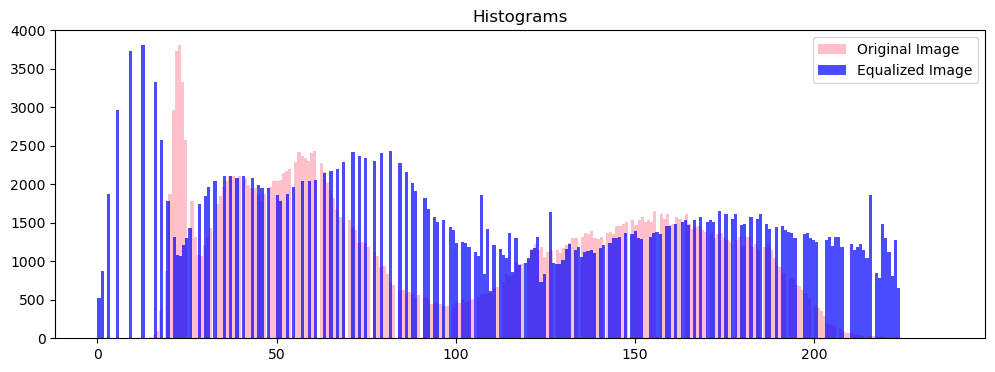

In [40]:
plt.figure(figsize=(12, 4))

plt.hist(flower_gray.flatten(),bins=256, color='pink', label='Original Image')
plt.hist(image_equalized.flatten(),bins=256, color='blue',alpha=0.7, label='Equalized Image')
plt.title('Histograms')
plt.legend()

- We observe that the equalized histogram appears flatter compared to the original one.
- Furthermore, we notice the big gaps are less appearent in the equalized histogram. This occurrence can be attributed to the finite number of pixels within each interval in a digital image.

5- Compare with the result obtained using the cv.equalizeHist function.

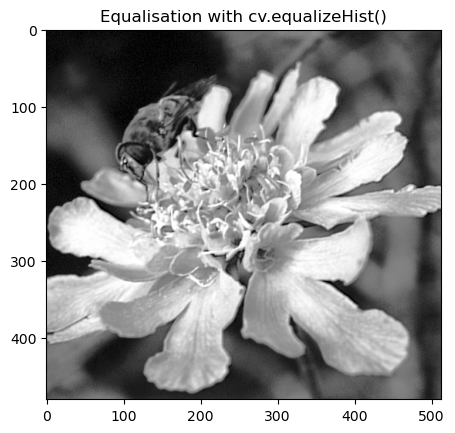

In [20]:
eq_cv2 = cv2.equalizeHist(flower_gray)

plt.imshow(eq_cv2, cmap="gray", vmin=0, vmax=255)
plt.title("Equalisation with cv.equalizeHist()")
plt.show()


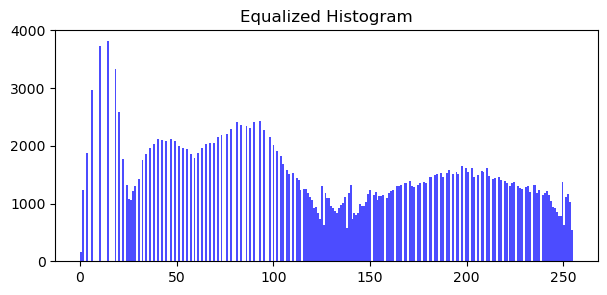

In [21]:
plt.figure(figsize=(7,3))
plt.hist(eq_cv2.flatten(),bins=256, color='blue',alpha=0.7, label='Equalized Image')
plt.title("Equalized Histogram")
plt.show()

Comparison

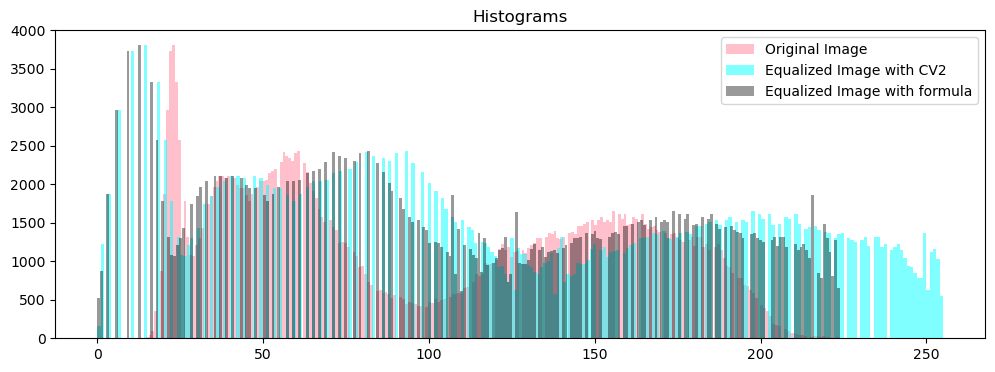

In [26]:
plt.figure(figsize=(12, 4))

plt.hist(flower_gray.flatten(),bins=256, color='pink', label='Original Image')
plt.hist(eq_cv2.flatten(),bins=256, color='cyan',alpha=0.5, label='Equalized Image with CV2')
plt.hist(image_equalized.flatten(),bins=256, color='black',alpha=0.4, label='Equalized Image with formula')

plt.title('Histograms')
plt.legend()

Comparison :
It is evident that when using the cv.equalizeHist function, nearly all values of gray levels are present and significant, unlike manual equalization where there is always some gaps and rarety of some intensities , but in general we can assume that both methodes make the original histogram better.
    

6- Equalize the 3 color components independently, then visualize the resulting image and calculate its entropy.

In [27]:
b, g, r = cv2.split(flower) #here i used the split funciton instead of part one where i used components of the channels
b_equalized = cv2.equalizeHist(b)
g_equalized = cv2.equalizeHist(g)
r_equalized = cv2.equalizeHist(r)

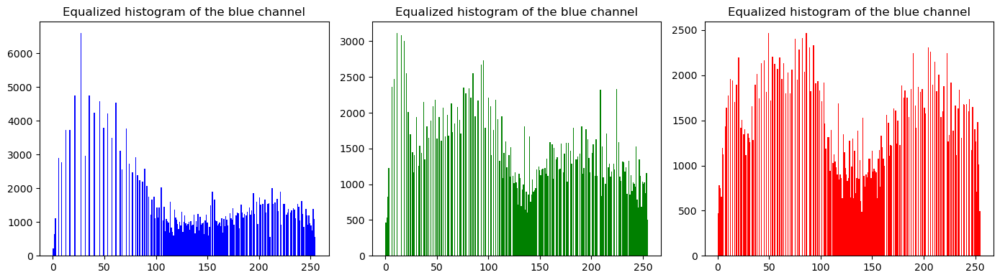

In [28]:
plt.figure(figsize=(14,4))

plt.subplot(1, 3, 1)
plt.hist(b_equalized.flatten(), bins=256, color='blue')
plt.title("Equalized histogram of the blue channel")

plt.subplot(1, 3, 2)
plt.hist(g_equalized.flatten(), bins=256, color='green')
plt.title("Equalized histogram of the blue channel")

plt.subplot(1, 3, 3)
plt.hist(r_equalized.flatten(), bins=256, color='red')
plt.title("Equalized histogram of the blue channel")


plt.tight_layout()
plt.show()

In [29]:
import skimage
from skimage.measure import shannon_entropy

equalized_image3 = cv2.merge((b_equalized, g_equalized, r_equalized))
entropy = skimage.measure.shannon_entropy(equalized_image3)
print(f'Entropy of the equalized image: {entropy:.2f}')


Entropy of the equalized image: 7.77


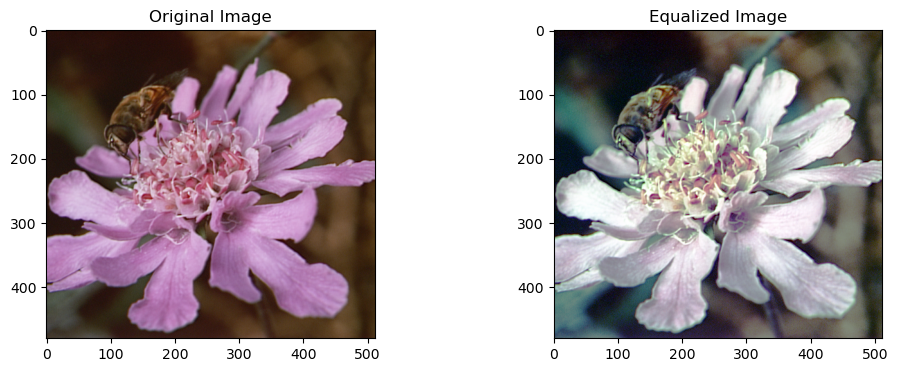

In [30]:
plt.figure(figsize=(12, 4))

plt.subplot(121)
plt.imshow(cv2.cvtColor(flower, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(122)
plt.imshow(cv2.cvtColor(equalized_image3, cv2.COLOR_BGR2RGB))
plt.title('Equalized Image')

plt.show()

7- Equalize the 3 color components based on the cumulative histogram from question 4, then visualize the corresponding image. Calculate its entropy.

In [36]:


def eq_cdf(channel):
    hist = cv2.calcHist([channel], [0], None, [256], [0, 256])
    cdf = hist.cumsum()
    min_intensity = np.min(channel)
    max_intensity = np.max(channel)
    equalization_mapping = np.round(((max_intensity - min_intensity-1) * cdf) / (channel.size))

    # Apply the equalization mapping to the image
    image_equalized = equalization_mapping[channel - min_intensity]

    # Reshape the image to its original dimensions
    image_equalized = image_equalized.reshape(channel.shape)

    return image_equalized


In [37]:
b, g, r = cv2.split(flower)
#iused the same function as quest 4 with the cdf
b_equalized = eq_cdf(b)
g_equalized = eq_cdf(g)
r_equalized = eq_cdf(r)

equalized_image4 = cv2.merge((b_equalized, g_equalized, r_equalized))
entropy2 = skimage.measure.shannon_entropy(equalized_image4)
print(f'Entropy of the equalized image: {entropy2:.2f}')

Entropy of the equalized image: 7.57


8- Compare the entropies and the histograms. Provide comments.

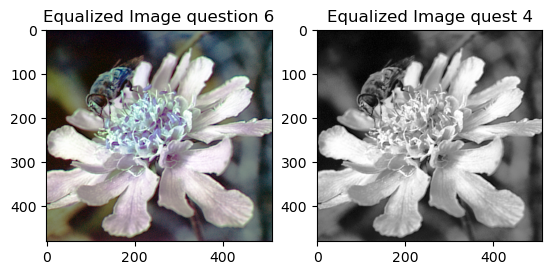

In [39]:
# Display the original and equalized images
plt.subplot(121)
plt.imshow(equalized_image3, cmap='gray')
plt.title('Equalized Image question 6')

plt.subplot(122)
plt.imshow(image_equalized, cmap='gray')
plt.title('Equalized Image quest 4')

plt.show()

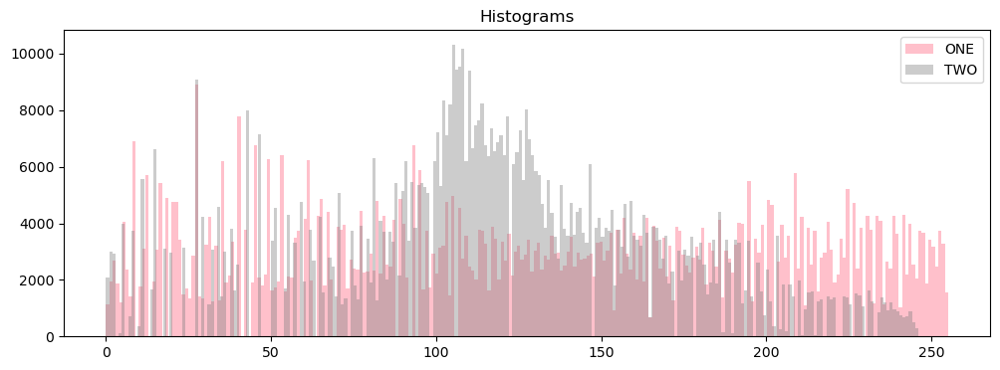

In [51]:
plt.figure(figsize=(12, 4))

plt.hist(equalized_image3.flatten(),bins=256, color='pink', label='ONE')
plt.hist(equalized_image4.flatten(),bins=256, color='gray',alpha=0.4, label='TWO')

plt.title('Histograms')
plt.legend()

entropy1 - entropy2 = 0.31

entropy1 > entropy2: The difference between the two entropies is slight.

It is noticeable that the histograms in the first case are flatter than those in the second case.

From the obtained results, it is clear that the second method, "using the cumulative histogram (gray levels)," yields a worst outcome than the first method, "equalization based on channels."

The result of the second method is unsatisfactory, while the first method (using the 3 channels eq) is much more visually pleasing.

# Noise Reduction

I. Add Gaussian noise to the image with zero mean and standard deviation σ = 0.01. Display the noisy image.

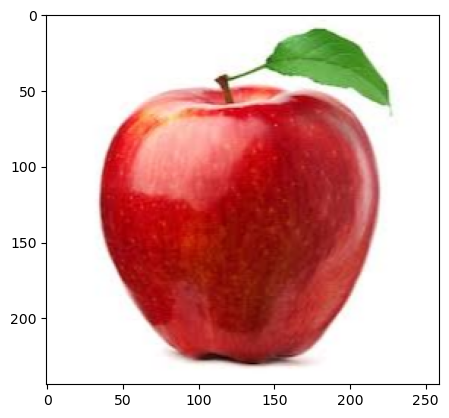

In [40]:
image = cv2.imread("./images/images/apple.png")
apple = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(apple)

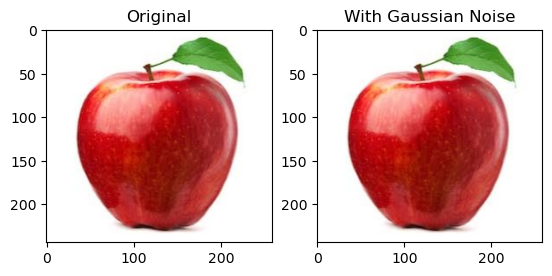

In [41]:
noise = np.random.normal(0, 0.01, apple.shape).astype(np.uint8)

# Add noise to the image
GN_image = cv2.add(apple, noise)

plt.subplot(121)
plt.imshow(apple, cmap='gray')
plt.title('Original')

plt.subplot(122)
plt.imshow(GN_image, cmap='gray')
plt.title('With Gaussian Noise')

plt.show()


It getts a little blurer ! ( the pic that i loaded was already noised with gaussian noise ) 

A. Mean Filter
1. Apply a 3x3 average filtering using the "cv.blur" function. Display the result and provide comments. What is the size of the obtained image? How were the edges treated? Change the method and comment.
2. Perform subtraction between the original image and the filtered image. Display the result and comment.
3. Repeat steps 2-4 for mask sizes of 5x5, 6x6, and 7x7. Conclude.

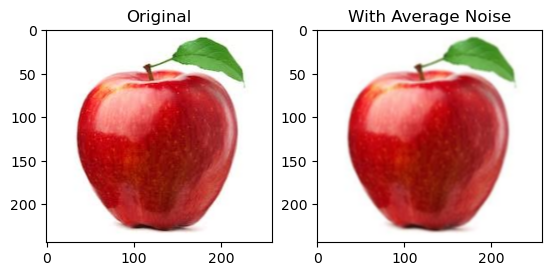

In [42]:
# Apply a 3x3 average filter
filtered_image = cv2.blur(apple, (3, 3))

# Display the result and provide comments.
plt.subplot(121)
plt.imshow(apple, cmap='gray')
plt.title('Original')

plt.subplot(122)
plt.imshow(filtered_image, cmap='gray')
plt.title('With Average Noise')

plt.show()


 The size of the obtained image remains the same as the original and the edges are treated using a simple averaging, which can cause some blurring.


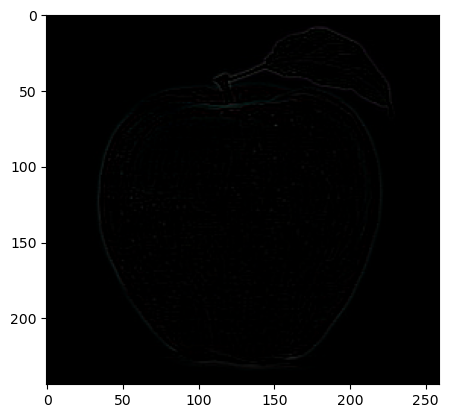

In [43]:
# Perform subtraction between the original image and the filtered image
subtracted_image = cv2.subtract(apple, filtered_image)
plt.imshow(subtracted_image)

We can notice the edges of the apple clearly !

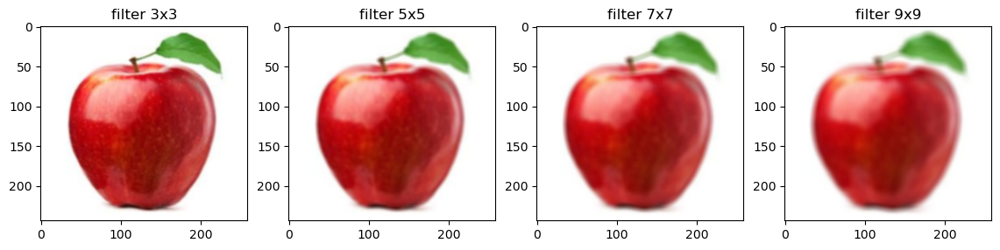

In [44]:
plt.figure(figsize=(14,4))
filtered_image5 = cv2.blur(apple, (5, 5))
filtered_image7 = cv2.blur(apple, (7, 7))
filtered_image9 = cv2.blur(apple, (9, 9))

plt.subplot(141)
plt.imshow(filtered_image, cmap='gray')
plt.title('filter 3x3')

plt.subplot(142)
plt.imshow(filtered_image5, cmap='gray')
plt.title('filter 5x5')

plt.subplot(143)
plt.imshow(filtered_image7, cmap='gray')
plt.title('filter 7x7')

plt.subplot(144)
plt.imshow(filtered_image9, cmap='gray')
plt.title('filter 9x9')

plt.show()

The blur increase with increaing of the kernel , A larger kernel tends to create more smoothing, potentially removing important information.
 <br> A larger kernel means a larger area is considered for averaging. Each pixel's value is replaced with the average of a larger number of neighboring pixels.

B. Gaussian Filter
1. Apply a 3x3 Gaussian filtering with σ = 1 using the "cv.GaussianBlur" function. Display the result and comment.
2. Investigate the influence of the filter size and the value of the standard deviation.
3. Select the mask that seems best to you. Perform subtraction between the original image and the filtered image. Comment.

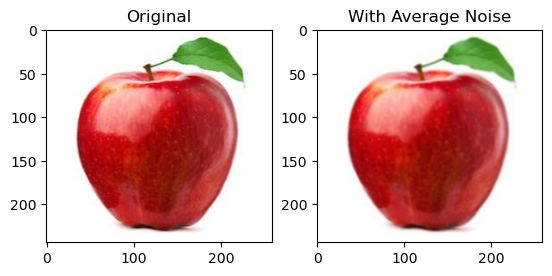

In [45]:
# Question 1
# Apply a 3x3 Gaussian filter with σ = 1
filtered_image = cv2.GaussianBlur(apple, (3, 3), 1)

# Display the result and provide comments.
plt.subplot(121)
plt.imshow(apple, cmap='gray')
plt.title('Original')

plt.subplot(122)
plt.imshow(filtered_image, cmap='gray')
plt.title('With Average Noise')

plt.show()


 Gaussian filtering typically provides  less blur more define than average filtering

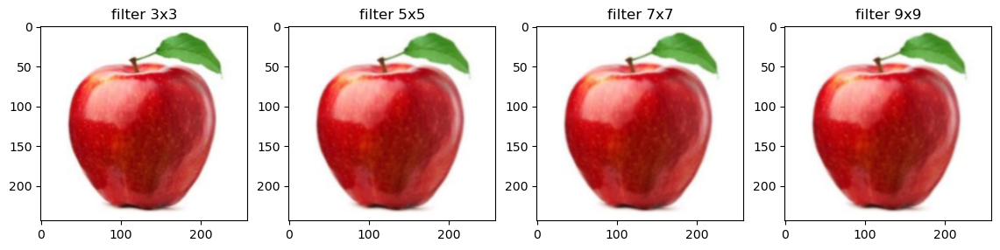

In [46]:
# Investigate the influence of filter size and σ.
# We can vary the filter size and σ to see their effects on the filtered image.
plt.figure(figsize=(14,4))

filtered_image5 = cv2.GaussianBlur(apple, (5, 5), 1)
filtered_image7 = cv2.GaussianBlur(apple, (7, 7), 1)
filtered_image9 = cv2.GaussianBlur(apple, (9, 9), 1)

plt.subplot(141)
plt.imshow(filtered_image, cmap='gray')
plt.title('filter 3x3')

plt.subplot(142)
plt.imshow(filtered_image5, cmap='gray')
plt.title('filter 5x5')

plt.subplot(143)
plt.imshow(filtered_image7, cmap='gray')
plt.title('filter 7x7')

plt.subplot(144)
plt.imshow(filtered_image9, cmap='gray')
plt.title('filter 9x9')

plt.show()



n the case of a Gaussian filter, increasing the kernel size also leads to increased blurring, but its handled differently compared to an average filter.
 The Gaussian filter is better at preserving edges while still reducing noise. However, with a larger kernel, more neighboring pixels influence the computation, leading to a stronger smoothing effect compared to a smaller kernel.

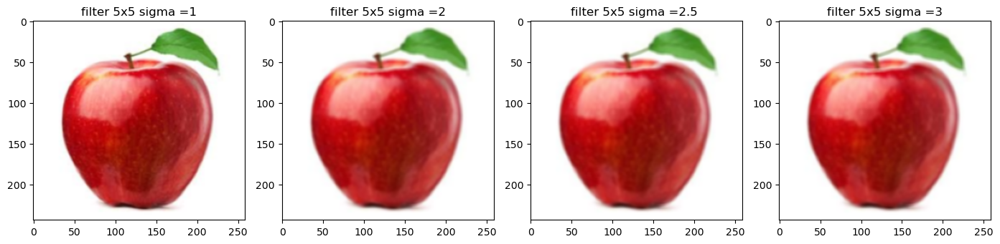

In [47]:
plt.figure(figsize=(14,4))

filtered_image2 = cv2.GaussianBlur(apple, (5, 5), 2)
filtered_image25 = cv2.GaussianBlur(apple, (5, 5), 2.5)
filtered_image3 = cv2.GaussianBlur(apple, (5, 5), 3)

plt.subplot(141)
plt.imshow(filtered_image, cmap='gray')
plt.title('filter 5x5 sigma =1')

plt.subplot(142)
plt.imshow(filtered_image2, cmap='gray')
plt.title('filter 5x5 sigma =2')

plt.subplot(143)
plt.imshow(filtered_image25, cmap='gray')
plt.title('filter 5x5 sigma =2.5 ')

plt.subplot(144)
plt.imshow(filtered_image3, cmap='gray')
plt.title('filter 5x5 sigma =3')

plt.tight_layout()
plt.show()


Its getting more blurer, a larger sigma value results in a wider Gaussian curve and, consequently, a broader distribution of weights. This leads to a more extensive averaging of pixels, causing a higher level of blurring in the resulting image.

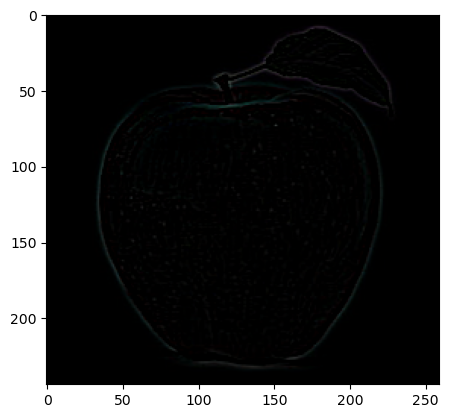

In [48]:
# It seems the filter 5x5 with sigma = 2.5 is the best yet 
# Perform subtraction between the original image and the filtered image
subtracted_image = cv2.subtract(apple, filtered_image25)
plt.imshow(subtracted_image)

The edges are clear as the sun! 

C. Median Filter
1. Apply median filtering using the "cv.medianBlur" function, considering various neighborhoods of 3x3, 5x5, 7x7, and 9x9. Compare and conclude.
2. Select the filter size that appears best to you. Perform subtraction between the original image and the filtered image. Comment.

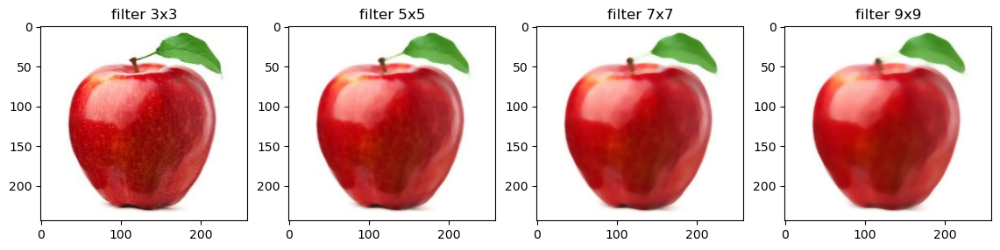

In [49]:
plt.figure(figsize=(14,4))

filtered_image5 = cv2.medianBlur(apple, 5)
filtered_image7 = cv2.medianBlur(apple, 7)
filtered_image9 = cv2.medianBlur(apple, 9)

plt.subplot(141)
plt.imshow(apple, cmap='gray')
plt.title('filter 3x3')

plt.subplot(142)
plt.imshow(filtered_image5, cmap='gray')
plt.title('filter 5x5')

plt.subplot(143)
plt.imshow(filtered_image7, cmap='gray')
plt.title('filter 7x7')

plt.subplot(144)
plt.imshow(filtered_image9, cmap='gray')
plt.title('filter 9x9')

plt.show()


 The median filter is good at preserving edges because it selects the median value within the neighborhood, As long as the majority of pixels in the neighborhood belong to the same region or edge, the filter won't significantly affect them.
 but with the kernel increasing it might also cause loss of finer details and textures, similar to other filters.

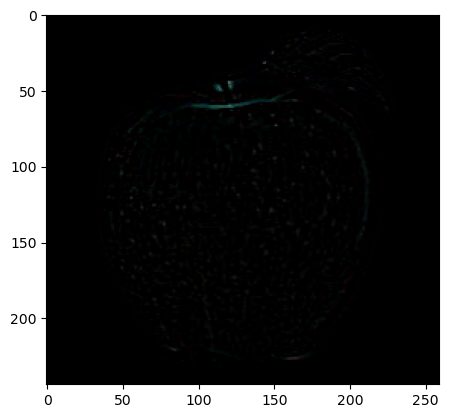

In [50]:
#the best yet is the 7x7 filter bcz it didnt blur too much the picture and yet it kept the edges clearly and the noise decreased
subtracted_image = cv2.subtract(apple, filtered_image7)
plt.imshow(subtracted_image)

III. Compare the three filters. Which filter is most suitable for Gaussian noise?


 See conclusion below

#Impulsive Noise


IV. Repeat the study of the three filters for impulsive noise with a 0.1 noise rate. Which filter is most suitable for impulsive noise?



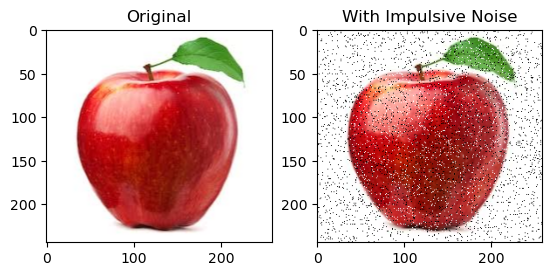

In [52]:
image = cv2.imread("./images/images/apple.png")
apple = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

noise_rate = 0.1
image = np.copy(apple)
height, width, channels = image.shape
# Calculate the number of pixels to be affected
num_noise_pixels = int(noise_rate * height * width)
# Generate random coordinates to add noise
for _ in range(num_noise_pixels):
    x = np.random.randint(0, width)
    y = np.random.randint(0, height)
    image[y, x] = [255, 255, 255] if np.random.random() < 0.5 else [0, 0, 0]  # Replace with black or white pixel

# Display the image with impulsive noise
plt.subplot(121)
plt.imshow(apple, cmap="gray")
plt.title('Original')

plt.subplot(122)
plt.imshow(image)
plt.title('With Impulsive Noise')

plt.show()

# Average filtering 

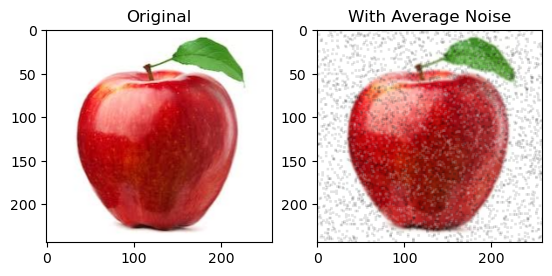

In [53]:
# Apply a 3x3 average filter
filtered_image = cv2.blur(image, (3, 3))

# Display the result and provide comments.
plt.subplot(121)
plt.imshow(apple, cmap='gray')
plt.title('Original')

plt.subplot(122)
plt.imshow(filtered_image, cmap='gray')
plt.title('With Average Noise')

plt.show()

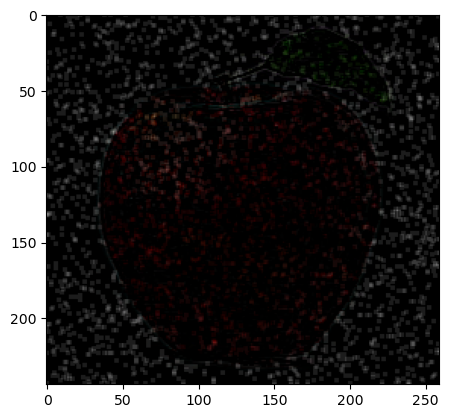

In [54]:
subtracted_image = cv2.subtract(apple, filtered_image)
plt.imshow(subtracted_image)

# Gaussian filtering

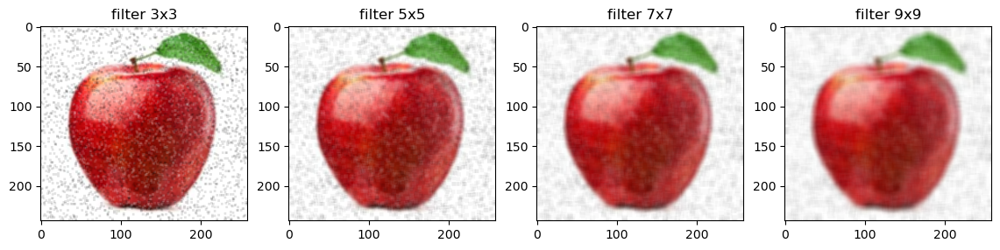

In [55]:
plt.figure(figsize=(14,4))
filtered_image5 = cv2.blur(image, (5, 5))
filtered_image7 = cv2.blur(image, (7, 7))
filtered_image9 = cv2.blur(image, (9, 9))

plt.subplot(141)
plt.imshow(filtered_image, cmap='gray')
plt.title('filter 3x3')

plt.subplot(142)
plt.imshow(filtered_image5, cmap='gray')
plt.title('filter 5x5')

plt.subplot(143)
plt.imshow(filtered_image7, cmap='gray')
plt.title('filter 7x7')

plt.subplot(144)
plt.imshow(filtered_image9, cmap='gray')
plt.title('filter 9x9')

plt.show()

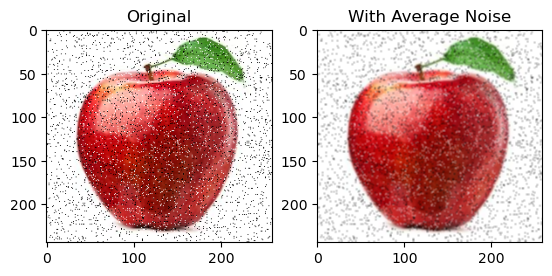

In [56]:
# Apply a 3x3 Gaussian filter with σ = 1
filtered_image = cv2.GaussianBlur(image, (3, 3), 1)

# Display the result and provide comments.
plt.subplot(121)
plt.imshow(image, cmap='gray')
plt.title('Original')

plt.subplot(122)
plt.imshow(filtered_image, cmap='gray')
plt.title('With Average Noise')

plt.show()

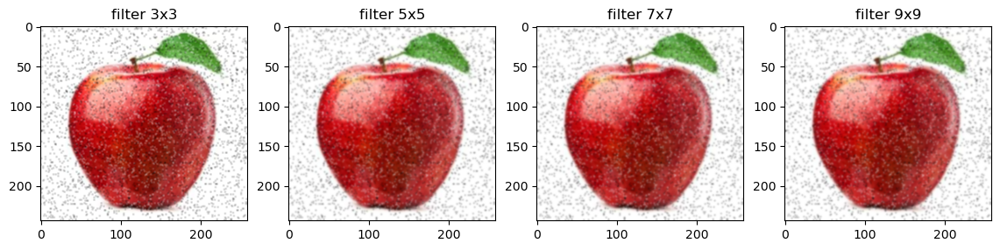

In [57]:
plt.figure(figsize=(14,4))

filtered_image5 = cv2.GaussianBlur(image, (5, 5), 1)
filtered_image7 = cv2.GaussianBlur(image, (7, 7), 1)
filtered_image9 = cv2.GaussianBlur(image, (9, 9), 1)

plt.subplot(141)
plt.imshow(filtered_image, cmap='gray')
plt.title('filter 3x3')

plt.subplot(142)
plt.imshow(filtered_image5, cmap='gray')
plt.title('filter 5x5')

plt.subplot(143)
plt.imshow(filtered_image7, cmap='gray')
plt.title('filter 7x7')

plt.subplot(144)
plt.imshow(filtered_image9, cmap='gray')
plt.title('filter 9x9')

plt.show()


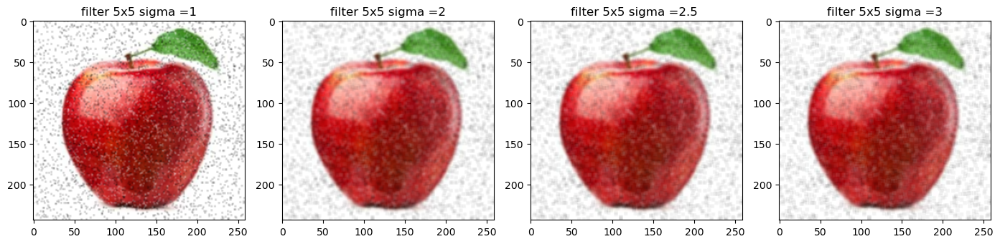

In [58]:
plt.figure(figsize=(14,4))

filtered_image2 = cv2.GaussianBlur(image, (5, 5), 2)
filtered_image25 = cv2.GaussianBlur(image, (5, 5), 2.5)
filtered_image3 = cv2.GaussianBlur(image, (5, 5), 3)

plt.subplot(141)
plt.imshow(filtered_image, cmap='gray')
plt.title('filter 5x5 sigma =1')

plt.subplot(142)
plt.imshow(filtered_image2, cmap='gray')
plt.title('filter 5x5 sigma =2')

plt.subplot(143)
plt.imshow(filtered_image25, cmap='gray')
plt.title('filter 5x5 sigma =2.5 ')

plt.subplot(144)
plt.imshow(filtered_image3, cmap='gray')
plt.title('filter 5x5 sigma =3')

plt.tight_layout()
plt.show()


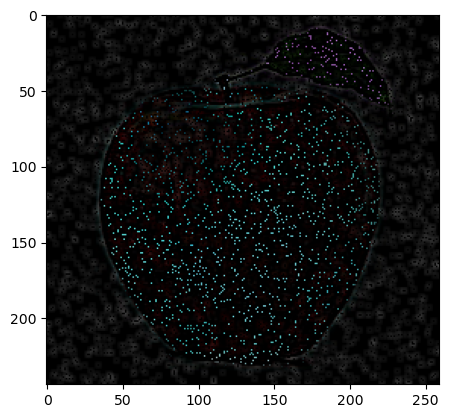

In [59]:
# Perform subtraction between the original image and the filtered image
subtracted_image = cv2.subtract(image, filtered_image2)
plt.imshow(subtracted_image)

# Median Filtering

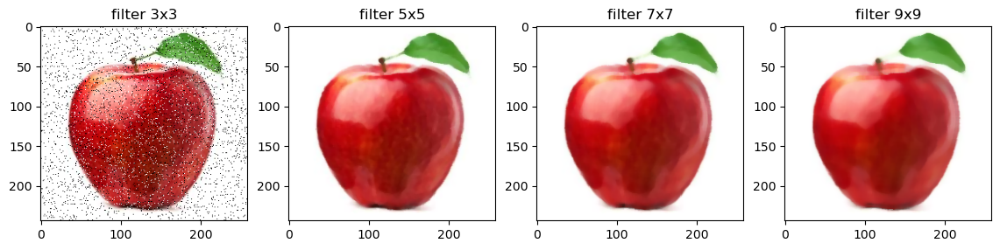

In [60]:
plt.figure(figsize=(14,4))

filtered_image5 = cv2.medianBlur(image, 5)
filtered_image7 = cv2.medianBlur(image, 7)
filtered_image9 = cv2.medianBlur(image, 9)

plt.subplot(141)
plt.imshow(image, cmap='gray')
plt.title('filter 3x3')

plt.subplot(142)
plt.imshow(filtered_image5, cmap='gray')
plt.title('filter 5x5')

plt.subplot(143)
plt.imshow(filtered_image7, cmap='gray')
plt.title('filter 7x7')

plt.subplot(144)
plt.imshow(filtered_image9, cmap='gray')
plt.title('filter 9x9')

plt.show()


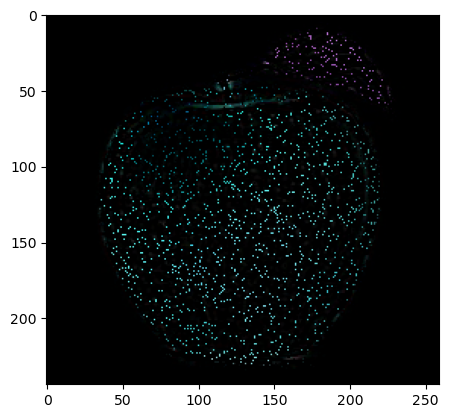

In [61]:
#the best is the 5X5 filter bcz it didnt blur too much the picture and yet it kept the edges clearly and the noise decreased
subtracted_image = cv2.subtract(image, filtered_image7)
plt.imshow(subtracted_image)

V. Revisit the median filter. Increase the percentage of replaced pixels (impulsive noise). Is the median filter still effective? If not, at what percentage does it cease to be effective in the case of impulsive noise?

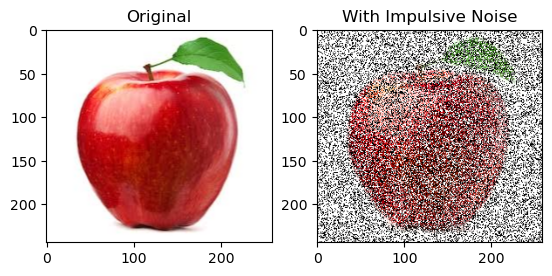

In [62]:
noise_rate = 0.8
height, width, channels = apple.shape
# Calculate the number of pixels to be affected
num_noise_pixels = int(noise_rate * height * width)
# Generate random coordinates to add noise
for _ in range(num_noise_pixels):
    x = np.random.randint(0, width)
    y = np.random.randint(0, height)
    image[y, x] = [255, 255, 255] if np.random.random() < 0.5 else [0, 0, 0] # Replace with black or white pixel

    # Display the image with impulsive noise
plt.subplot(121)
plt.imshow(apple, cmap="gray")
plt.title('Original')

plt.subplot(122)
plt.imshow(image)
plt.title('With Impulsive Noise')

plt.show()

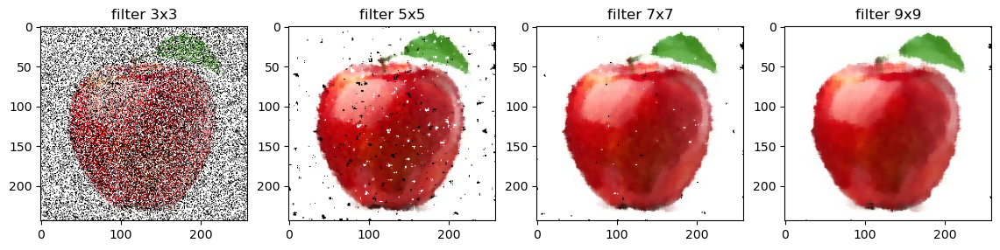

In [63]:
plt.figure(figsize=(14,4))

filtered_image5 = cv2.medianBlur(image, 5)
filtered_image7 = cv2.medianBlur(image, 7)
filtered_image9 = cv2.medianBlur(image, 9)

plt.subplot(141)
plt.imshow(image, cmap='gray')
plt.title('filter 3x3')

plt.subplot(142)
plt.imshow(filtered_image5, cmap='gray')
plt.title('filter 5x5')

plt.subplot(143)
plt.imshow(filtered_image7, cmap='gray')
plt.title('filter 7x7')

plt.subplot(144)
plt.imshow(filtered_image9, cmap='gray')
plt.title('filter 9x9')

plt.show()


When does it stop to work effectively?

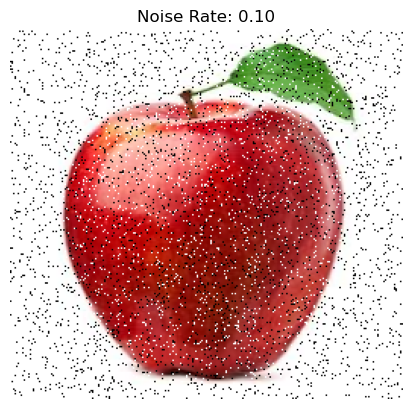

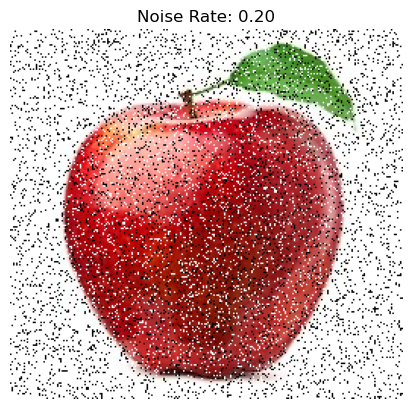

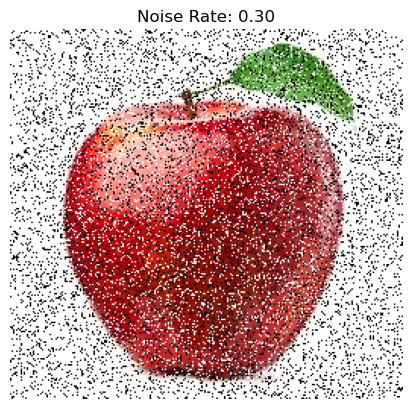

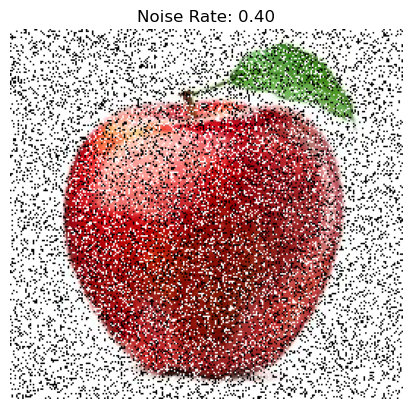

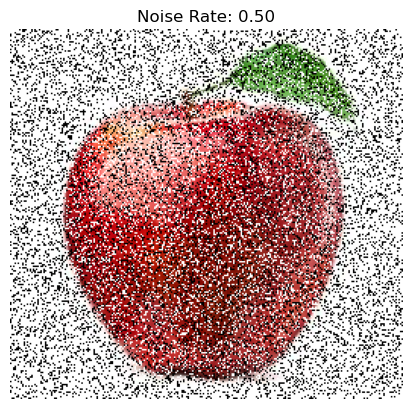

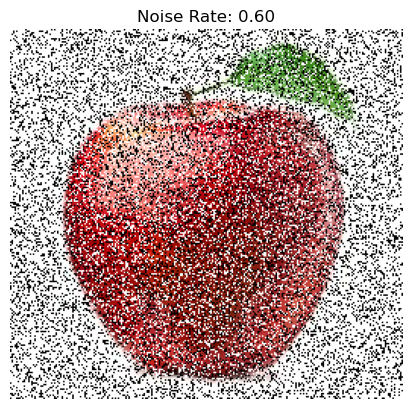

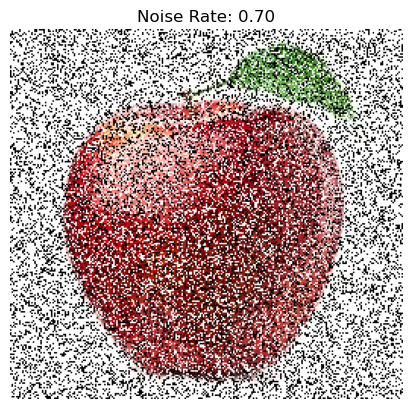

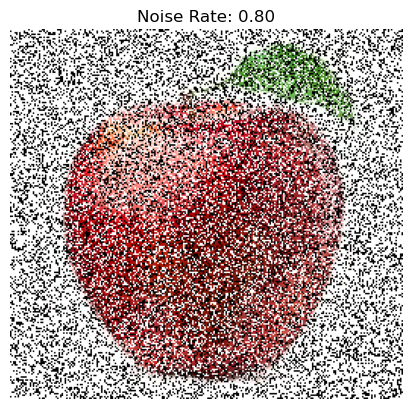

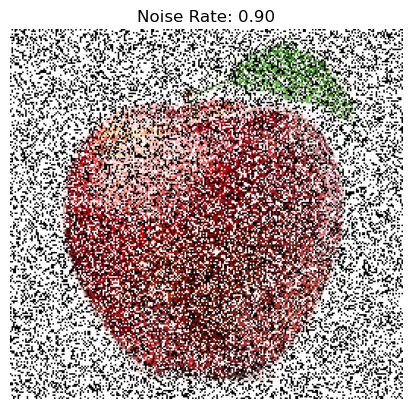

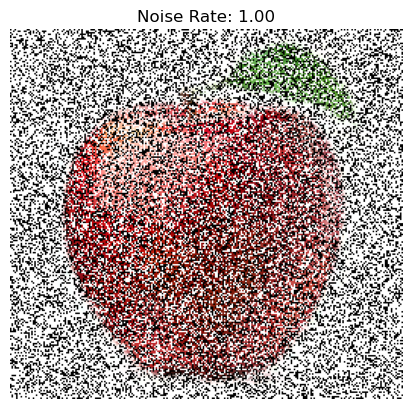

In [64]:
for noise_rate in np.linspace(0.1, 1.0, num=10):  # Increasing noise from 0.1 to 1 in 10 steps
    # Create a copy of the original image to add noise gradually
    noisy_image = np.copy(apple)

    height, width, channels = noisy_image.shape
    # Calculate the number of pixels to be affected
    num_noise_pixels = int(noise_rate * height * width)

    # Generate random coordinates to add noise
    for _ in range(num_noise_pixels):
        x = np.random.randint(0, width)
        y = np.random.randint(0, height)
        noisy_image[y, x] = [255, 255, 255] if np.random.random() < 0.5 else [0, 0, 0]  # Replace with black or white pixel

    # Display or save the image with impulsive noise at each level
    plt.imshow(noisy_image)
    plt.title(f"Noise Rate: {noise_rate:.2f}")
    plt.axis('off')
    plt.show()

# Conclusion Noise

# For Gaussian Noise : 

- Average Filter (cv2.blur):
The average filter is not very effective at reducing Gaussian noise since it treats all pixel values equally within the neighborhood & It tends to blur edges and fine details in the image 
Suitable For: The average filter is more suitable for removing uniform noise.

- Gaussian Filter (cv2.GaussianBlur):
The Gaussian filter is more effective at reducing Gaussian noise compared to the average filter. It assigns different weights to pixels based on their proximity, providing better noise reduction & It preserves edges better than the average filter, but there may still be some blurring.
Suitable For: The Gaussian filter is a good choice for reducing Gaussian noise.

- Median Filter (cv2.medianBlur):
The median filter is highly effective at removing impulsive noise, such as salt-and-pepper noise, but it may not perform as well for Gaussian noise & It tends to preserve edges and fine details well.
Suitable For: The median filter is ideal for impulsive noise but may not be the best choice for Gaussian noise.

- For Gaussian noise specifically, the Gaussian filter is generally the most suitable option due to its weighted approach, which considers the proximity of pixels. 


# Implusive Noise 

- Average Filter : 
Only make the image blurer because its averaging the pixels around the kernel center, so it treats the implusive noise without consideration. 
- Gaussian Filter: 
Gaussian filters tend to blur the image but might not effectively remove salt-and-pepper noise since they're designed to smooth images with continuous noise rather than handle sudden, extreme pixel values.
- Median Filter:
The median filter is particularly effective against impulsive noise. It replaces pixel values with the median of neighboring pixels, ignoring outliers. This property helps in reducing salt-and-pepper noise while preserving edges and details.

- In scenarios with impulsive noise, the median filter tends to be the preferred choice due to its ability to handle outliers effectively. However, finding the right balance between noise reduction and preserving image details remains essential, especially with larger kernel sizes that can impact detail retention.

- However, the effectiveness of any filter depends on the noise level, the filter parameters (e.g., size and standard deviation for Gaussian filtering), and the specific characteristics of the image, because as we did the last manipulation , the median filter has limits on reducing BIG impulsive noise!!!